In [1]:
import os
import pandas as pd
import folium
import geopandas as gpd
import numpy as np

### Summary Statistics using Maps

In [199]:
# read segement summary scenario data
dfSegSum = pd.read_csv('dfSegSummary.csv')
dfSegSum['fullName'] = dfSegSum['tdmVersion'] + '_' + dfSegSum['scenarioName']

In [131]:
# read segment shapefile into spatial enabled dataframe
dirSegShp = r'A:\1 - TDM\1 - Input Dev\6 - Segment\0 - Segment Shapefile\Master_Segs_withFactors_20220915\Master_Segs_withFactors_20220915shp.shp'
segShp = gpd.read_file(dirSegShp)
segShp.head()
segShp = segShp[['SEGID','geometry']]

### Geopandas


In [205]:
# select the two scenarios to compare
scenario1 = 1
scenario2 = 7
variable = 'DY_VOL'
dfSegSum1 = dfSegSum.query('scenarioID == @scenario1')
dfSegSum2 = dfSegSum.query('scenarioID == @scenario2')
scenario1Name = dfSegSum1['fullName'].iloc[0]
scenario2Name = dfSegSum2['fullName'].iloc[0]

In [206]:
# get a 'dif' file showing the differences of all variables between the two scenarios
lstVars = ['DIST_1WY', 'LANES','CAP1HL', 'AM_VOL', 'MD_VOL', 'PM_VOL', 'EV_VOL', 'DY_VOL', 'DY_LT', 'DY_MD', 'DY_HV', 'FF_SPD', 'AM_SPD', 'MD_SPD', 'PM_SPD', 'EV_SPD', 'DY_SPD', 'D1_LINKS', 'D1_DIST', 'D1_LANES', 'D1_FT', 'D1_FTCLASS', 'D1_CAP1HL', 'D1_AM_VOL', 'D1_MD_VOL', 'D1_PM_VOL', 'D1_EV_VOL', 'D1_DY_VOL', 'D1_DY_LT', 'D1_DY_MD', 'D1_DY_HV', 'D1_FF_SPD', 'D1_AM_SPD', 'D1_MD_SPD', 'D1_PM_SPD', 'D1_EV_SPD', 'D1_DY_SPD', 'D2_LINKS', 'D2_DIST', 'D2_LANES', 'D2_FT', 'D2_FTCLASS', 'D2_CAP1HL', 'D2_AM_VOL', 'D2_MD_VOL', 'D2_PM_VOL', 'D2_EV_VOL', 'D2_DY_VOL', 'D2_DY_LT', 'D2_DY_MD', 'D2_DY_HV', 'D2_FF_SPD', 'D2_AM_SPD', 'D2_MD_SPD', 'D2_PM_SPD', 'D2_EV_SPD', 'D2_DY_SPD']
dfSegSum2[lstVars] *= -1
dfSegSumDiff = pd.concat([dfSegSum1,dfSegSum2]).groupby(['SEGID'], as_index=False).sum()

ftClass = dfSegSum1[['SEGID','FTCLASS']]
dfSegSumDiffFt = pd.merge(ftClass, dfSegSumDiff,on='SEGID', how='left')

sdfSegSumDiff = segShp.merge(dfSegSumDiffFt, on = 'SEGID')

C:\Users\cday\AppData\Local\ESRI\conda\envs\arcgispro-py3-geopandas\lib\site-packages\pandas\core\frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [207]:
conditions = [
    (sdfSegSumDiff[variable].lt(-10000)),
    (sdfSegSumDiff[variable].ge(-10000) & sdfSegSumDiff[variable].lt(-3000)),
    (sdfSegSumDiff[variable].ge(-3000) & sdfSegSumDiff[variable].lt(-1000)),
    (sdfSegSumDiff[variable].ge(-1000) & sdfSegSumDiff[variable].lt(1000)),
    (sdfSegSumDiff[variable].ge(1000) & sdfSegSumDiff[variable].lt(3000)),
    (sdfSegSumDiff[variable].ge(3000) & sdfSegSumDiff[variable].le(10000)),
    (sdfSegSumDiff[variable].gt(10000)),
]
choices = [5,4,3,2,3,4,5]
sdfSegSumDiff["lw"] = np.select(conditions, choices)
sdfSegSumDiff['lwf'] = np.where(sdfSegSumDiff['FTCLASS'] == 'Freeway', sdfSegSumDiff['lw'], sdfSegSumDiff['lw'] - 1.9)

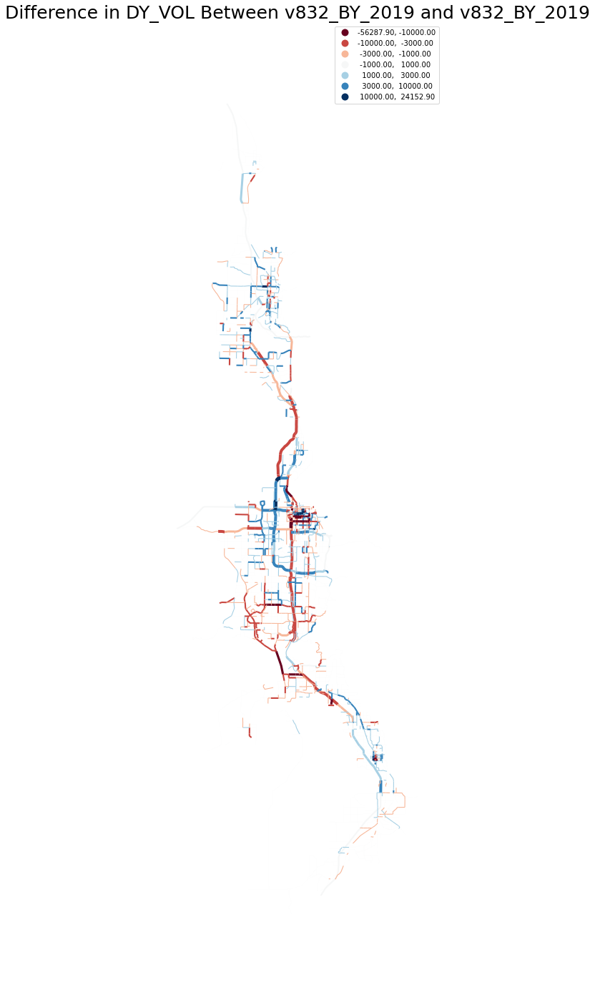

In [210]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"]=25,25

fig, ax = plt.subplots()
sdfSegSumDiff.plot(column=variable, cmap='RdBu', scheme="userdefined", 
                   legend=True, classification_kwds=dict(bins=[-10000,-3000,-1000,1000,3000,10000]),
                   linewidth=sdfSegSumDiff['lwf'],ax=ax
                  )
ax.margins(0.1)
ax.axis('off')
ax.set_title('Difference in ' + variable + ' Between ' + scenario1Name + ' and ' + scenario2Name, fontdict={'fontsize': '25', 'fontweight' : '3'})
plt.show()

#### Leaflet

In [9]:
#scenarioID = 1
#sdfSegSum = sdfSegSum.query('scenarioID == @scenarioID')
#
#m = folium.Map(
#    location=[40.7608, -111.8910],
#    tiles="cartodbpositron",
#    zoom_start=9,
#)
#
#
#for _, r in sdfSegSum.iterrows():
#    # Without simplifying the representation of each borough,
#    # the map might not be displayed
#    sim_geo = gpd.GeoSeries(r['geometry'])
#    geo_j = sim_geo.to_json()
#    geo_j = folium.GeoJson(data=geo_j,
#                           style_function=lambda x: {'fillColor': 'orange'})
#    folium.Popup(r['AM_VOL']).add_to(geo_j)
#    geo_j.add_to(m)
#m

TypeError: Location should be a sized variable, for example a list or a tuple, instead got <shapely.geometry.linestring.LineString object at 0x000002643990C588> of type <class 'shapely.geometry.linestring.LineString'>.

In [6]:
scenarioID = 1
sdfSegSum = sdfSegSum.query('scenarioID == @scenarioID')
# convert spatial enabled dataframe to geojson -- to read with leaflet mapping
# write if statement to only create geojson if it doesn't already exist
sdfSegSum.to_file('scenarioGeojsons/scenario' + str(scenarioID) + '.geojson', driver='GeoJSON')
sdfSegSum = gpd.read_file('scenarioGeojsons/scenario' + str(scenarioID) + '.geojson')

In [10]:
m = folium.Map(
    location=[40.7608, -111.8910],
    tiles="cartodbpositron",
    zoom_start=9,
)
folium.GeoJson(sdfSegSum, name="geojson").add_to(m)
m

In [ ]:
#dirSegShp = r'A:\1 - TDM\1 - Input Dev\6 - Segment\0 - Segment Shapefile\Master_Segs_withFactors_20220915\Master_Segs_withFactors_20220915shp.shp'

#import into spatially-enabled DataFrame
#sdf_Forecasts = pd.DataFrame.spatial.from_featureclass(dirSegShp)
#sdf_Forecasts_short = sdf_Forecasts[['SEGID','SHAPE']]

In [ ]:
#Define coordinates of where we want to center our map
boulder_coords = [40.015, -105.2705]

map_with_tiles = folium.Map(location = boulder_coords, tiles = 'cartodb positron')
map_with_tiles
#folium.PolyLine(segShp['geometry']).add_to(map_with_tiles)